# **DATA SELECTION**


---


Pengumpulan data diperoleh melalui proses **Crawling**


---



In [ ]:
# Install dan import library yang diperlukan
!pip install pandas
!pip install sastrawi
!pip install PySastrawi

import numpy as np
import pandas as pd
import datetime


In [ ]:
import pandas as pd
# Load dataset
# Try specifying the separator as semicolon and handle bad lines
data = pd.read_csv('data_mbg.csv', encoding='latin1', sep=';', on_bad_lines='skip')
data.head()

,conversation_id_str,created_at,favorite_count,full_text,id_str,image_url,in_reply_to_screen_name,lang,location,quote_count,reply_count,retweet_count,tweet_url,user_id_str,username,label
0,1.990000e+18,Mon Nov 03 23:57:56 +0000 2025,0,@txtdrimedia masyarakat seperinya lebih berhar...,1.990000e+18,NaN,txtdrimedia,in,NaN,0.0,0.0,2.0,https://x.com/undefined/status/198549669723418...,1.570000e+18,NaN,netral
1,1.990000e+18,Mon Nov 03 23:55:39 +0000 2025,0,dalam meningkatkan efisiensi dan kualitas pela...,1.990000e+18,NaN,bpskabnganjuk,in,NaN,0.0,0.0,0.0,https://x.com/undefined/status/198549612635588...,1.220000e+18,NaN,netral
2,1.990000e+18,Mon Nov 03 23:55:38 +0000 2025,0,BPS Kabupaten Nganjuk melaksanakan Pelatihan ...,1.990000e+18,https://pbs.twimg.com/amplify_video_thumb/1985...,NaN,in,NaN,0.0,1.0,0.0,https://x.com/undefined/status/198549611925492...,1.220000e+18,NaN,netral
3,1.990000e+18,Mon Nov 03 23:54:37 +0000 2025,0,Mafi Dukung dan sukseskan MBG https://t.co/EMw...,1.990000e+18,https://pbs.twimg.com/media/G43l9vdbQAU1gbk.jpg,NaN,in,NaN,0.0,0.0,0.0,https://x.com/undefined/status/198549586516821...,1.390000e+18,NaN,netral
4,1.990000e+18,Mon Nov 03 23:54:18 +0000 2025,0,@Zakill_ @tempodotco Faktor utama pelecehan se...,1.990000e+18,NaN,Zakill_,in,NaN,0.0,0.0,0.0,https://x.com/undefined/status/198549578356799...,1.720000e+18,NaN,netral


# **DATA PREPOCESSING**


---


Pembersihan data mentah agar menjadi lebih terstruktur. Atribut **full_tex** di ubah menjadi atribut **komentar**, Lalu hanya memilih kolom **komentar** dan **label** saja.


---



In [ ]:
#Mengubah nama kolom
data = data.rename(columns={'full_text': 'komentar'})
data.head()

,conversation_id_str,created_at,favorite_count,komentar,id_str,image_url,in_reply_to_screen_name,lang,location,quote_count,reply_count,retweet_count,tweet_url,user_id_str,username,label
0,1.990000e+18,Mon Nov 03 23:57:56 +0000 2025,0,@txtdrimedia masyarakat seperinya lebih berhar...,1.990000e+18,NaN,txtdrimedia,in,NaN,0.0,0.0,2.0,https://x.com/undefined/status/198549669723418...,1.570000e+18,NaN,netral
1,1.990000e+18,Mon Nov 03 23:55:39 +0000 2025,0,dalam meningkatkan efisiensi dan kualitas pela...,1.990000e+18,NaN,bpskabnganjuk,in,NaN,0.0,0.0,0.0,https://x.com/undefined/status/198549612635588...,1.220000e+18,NaN,netral
2,1.990000e+18,Mon Nov 03 23:55:38 +0000 2025,0,BPS Kabupaten Nganjuk melaksanakan Pelatihan ...,1.990000e+18,https://pbs.twimg.com/amplify_video_thumb/1985...,NaN,in,NaN,0.0,1.0,0.0,https://x.com/undefined/status/198549611925492...,1.220000e+18,NaN,netral
3,1.990000e+18,Mon Nov 03 23:54:37 +0000 2025,0,Mafi Dukung dan sukseskan MBG https://t.co/EMw...,1.990000e+18,https://pbs.twimg.com/media/G43l9vdbQAU1gbk.jpg,NaN,in,NaN,0.0,0.0,0.0,https://x.com/undefined/status/198549586516821...,1.390000e+18,NaN,netral
4,1.990000e+18,Mon Nov 03 23:54:18 +0000 2025,0,@Zakill_ @tempodotco Faktor utama pelecehan se...,1.990000e+18,NaN,Zakill_,in,NaN,0.0,0.0,0.0,https://x.com/undefined/status/198549578356799...,1.720000e+18,NaN,netral




---


**PERSIAPAN DATA**

Pemilihan atribut yang hanya fokus kepada proses analisis **persepsi/komentar**


---



In [ ]:
# membuat file baru yang hanya berisi kolom 'full_text' dan 'label'
data = data[['komentar', 'label']]
data.to_csv('hasil_data_sentimen.csv', index=False)
data.head()

,komentar,label
0,@txtdrimedia masyarakat seperinya lebih berhar...,netral
1,dalam meningkatkan efisiensi dan kualitas pela...,netral
2,BPS Kabupaten Nganjuk melaksanakan Pelatihan ...,netral
3,Mafi Dukung dan sukseskan MBG https://t.co/EMw...,netral
4,@Zakill_ @tempodotco Faktor utama pelecehan se...,netral




---


**DESKRIPSI**

Membuat file baru dengan 2 atribut yaitu, **Komentar dan Labe**l, dengan tujuan utama analisis sentiment yang berfokus ke tahapan **preprocessing** dengan mudah dipahami sampai ke tahap-tahap berikutnya


---



In [ ]:
# Melihat Missing Values dari Kolom yang ada
print(data.isnull().sum())

komentar    0
label       0
dtype: int64


In [ ]:
#Melihat Typedata
print(data.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5000 entries, 0 to 4999
Data columns (total 2 columns):
 #   Column    Non-Null Count  Dtype 
---  ------    --------------  ----- 
 0   komentar  5000 non-null   object
 1   label     5000 non-null   object
dtypes: object(2)
memory usage: 78.3+ KB
None


In [ ]:
# Menampilkan jumlah duplikat
duplicates = data.duplicated()
print(duplicates.sum())

361


In [ ]:
# Hapus baris duplikat
data.drop_duplicates(inplace=True)

# Tampilkan kembali jumlah duplikat untuk verifikasi
duplicates_after_removal = data.duplicated()
print(duplicates_after_removal.sum())

0




---


**DIAGRAM SENTIMEN POSITIF NEGATIF NETRAL**

Membuat visual diagram dengan 3 label sentimen yaitu, **Positif, Negatif dan Netral**


---



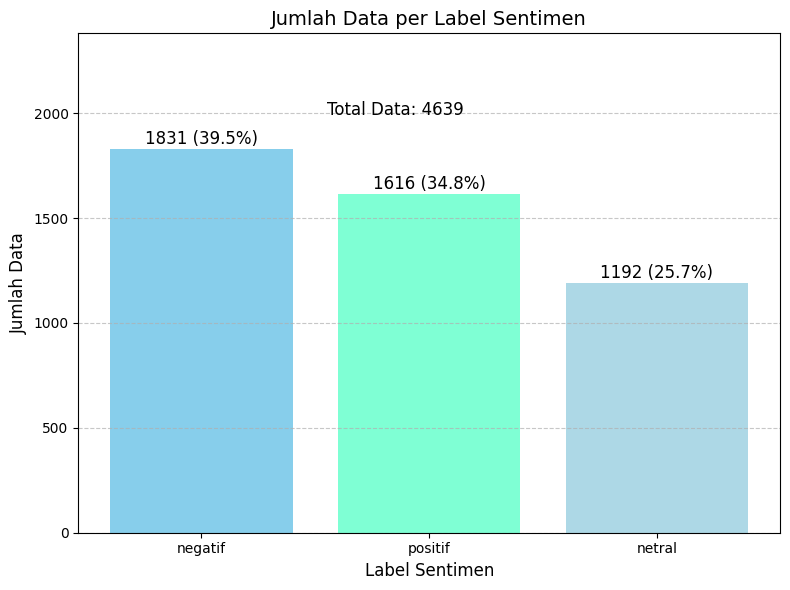

In [ ]:
import matplotlib.pyplot as plt

# Normalize the 'label' column: convert to lowercase and strip whitespace
data['label'] = data['label'].str.lower().str.strip()

# Hitung jumlah data untuk setiap label
label_counts = data['label'].value_counts()
labels = label_counts.index
counts = label_counts.values
percentages = (counts / counts.sum()) * 100
total_data = counts.sum()

# Buat diagram batang
plt.figure(figsize=(8, 6))
bars = plt.bar(labels, counts, color=['skyblue', 'aquamarine','lightblue'])

# Tambahkan jumlah & persentase di atas masing-masing batang
for bar, count, percentage in zip(bars, counts, percentages):
    height = bar.get_height()
    plt.text(
        bar.get_x() + bar.get_width() / 2,
        height + 1,
        f'{count} ({percentage:.1f}%)',
        ha='center',
        va='bottom',
        fontsize=12
    )

# Tambahkan judul dan label sumbu
plt.title('Jumlah Data per Label Sentimen', fontsize=14)
plt.xlabel('Label Sentimen', fontsize=12)
plt.ylabel('Jumlah Data', fontsize=12)
plt.ylim(0, max(counts) * 1.3)  # beri ruang di atas batang

# Tambahkan teks jumlah total data
plt.figtext(0.5, 0.8, f'Total Data: {total_data}', ha='center', fontsize=12)

plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

# **ANALISIS SENTIMENT**

# **CASE FOLDING**


---


Mengubah teks menjadi huruf kecil (**lowercase**).


---



In [ ]:
# Case Folding
data['case_folding'] = data['komentar'].str.lower()
display(data[['komentar','case_folding']].style.set_sticky())

,komentar,case_folding
0,@txtdrimedia masyarakat seperinya lebih berharap harga pangan lebih terjangkau daripada adanya MBG mungkin memang zulhas gak pernah terjun ke lingkungan masyarakat langsung buat dengerin keluhan masyarakat,@txtdrimedia masyarakat seperinya lebih berharap harga pangan lebih terjangkau daripada adanya mbg mungkin memang zulhas gak pernah terjun ke lingkungan masyarakat langsung buat dengerin keluhan masyarakat
1,dalam meningkatkan efisiensi dan kualitas pelaksanaan kegiatan statistik. #bpsnganjuk #bps #mbg #bgn #nganjukmelesat,dalam meningkatkan efisiensi dan kualitas pelaksanaan kegiatan statistik. #bpsnganjuk #bps #mbg #bgn #nganjukmelesat
2,BPS Kabupaten Nganjuk melaksanakan Pelatihan Petugas Survei Khusus Monitoring dan Evaluasi MBG Tahap 2 pada ÃÂ¯ÃÂ¸ÃÂ 28 29 Oktober 2025 di Kantor BPS Kabupaten Nganjuk. Pelatihan diikuti oleh 5 Pencacah Lapangan 2 Pemeriksa Lapangan dan 1 Admin FASIH guna membekali petugas https://t.co/SWtkH6Pp3N,bps kabupaten nganjuk melaksanakan pelatihan petugas survei khusus monitoring dan evaluasi mbg tahap 2 pada ãâ¯ãâ¸ãâ 28 29 oktober 2025 di kantor bps kabupaten nganjuk. pelatihan diikuti oleh 5 pencacah lapangan 2 pemeriksa lapangan dan 1 admin fasih guna membekali petugas https://t.co/swtkh6pp3n
3,Mafi Dukung dan sukseskan MBG https://t.co/EMwZWh7Fkj,mafi dukung dan sukseskan mbg https://t.co/emwzwh7fkj
4,@Zakill_ @tempodotco Faktor utama pelecehan seksual di dapur MBG Bekasi termasuk minimnya pengawasan jam kerja yang tidak ideal sehingga menciptakan isolasi serta ketidakseimbangan kekuasaan antara atasan dan bawahan. Lingkungan kerja tertutup seperti dap,@zakill_ @tempodotco faktor utama pelecehan seksual di dapur mbg bekasi termasuk minimnya pengawasan jam kerja yang tidak ideal sehingga menciptakan isolasi serta ketidakseimbangan kekuasaan antara atasan dan bawahan. lingkungan kerja tertutup seperti dap
5,MBG ini terus ada aja masalah nya ya emang dari awal gk usah adain program ini lebih banyak minus nya,mbg ini terus ada aja masalah nya ya emang dari awal gk usah adain program ini lebih banyak minus nya
6,Budget diambil darimana utk bayar buzzerp? Ini 3 contoh akun Buzzerp / influencer MBG https://t.co/94L8ZWwYEs,budget diambil darimana utk bayar buzzerp? ini 3 contoh akun buzzerp / influencer mbg https://t.co/94l8zwwyes
7,BGN kembali membuka portal pendaftaran mitra Satuan Pelayanan Pemenuhan Gizi (SPPG) untuk Program Makan Bergizi Gratis (MBG) yang sebelumnya sempat ditutup sementara (ANTARANEWS) #MorningBreakfast #KBFM #RadioKalimaya #RadioSebayaMudaMalangRaya #RadioAnakMuda #RadioDewasaMuda https://t.co/TOLObQQLxC,bgn kembali membuka portal pendaftaran mitra satuan pelayanan pemenuhan gizi (sppg) untuk program makan bergizi gratis (mbg) yang sebelumnya sempat ditutup sementara (antaranews) #morningbreakfast #kbfm #radiokalimaya #radiosebayamudamalangraya #radioanakmuda #radiodewasamuda https://t.co/tolobqqlxc
8,Siswa Terima Asupan Sehat Babinsa Kodim 1802/Sorong Kawal Pendistribusian MBG. https://t.co/gug0RI2GzO https://t.co/x6wvAWIe6R,siswa terima asupan sehat babinsa kodim 1802/sorong kawal pendistribusian mbg. https://t.co/gug0ri2gzo https://t.co/x6wvawie6r
9,@jajatplus @Scorpio_1420 Lebih ke pekerja mbg diambil dari warga kurang mampu gini bukanya kerabat,@jajatplus @scorpio_1420 lebih ke pekerja mbg diambil dari warga kurang mampu gini bukanya kerabat


# **CLEANING**


---


Tahapan ini memastikan bahwa data yang digunakan lebih bersih dan konsisten.
Menghapus **tanda baca**, **url**, **link**, **angka**, **tagar** dan **mention**, **emoji**, dan **spasi berlebih**.


---



In [ ]:
import string
import re

#CLEANING
def cleaning(tweet):
    #remove ascii
    tweet = tweet.encode('ascii', 'replace').decode('ascii')
    #remove RT
    tweet = re.sub(r'^RT[\s]+', '', tweet)
    #remove mention, link, hashtag
    tweet = ' '.join(re.sub("([@#_][A-Za-z3-9]+)|(\w+:\/\/\S+)"," ", tweet).split())
    tweet = re.sub('@[^\s]+', '', tweet)
    tweet = re.sub(r'#', '', tweet)
    #remove url
    tweet = re.sub(r'\w+:\/(Ardy)[\d\w-]+(\.[\d\w-]+)*(?:(?:\/[^\s/]*))*', '', tweet)
    #remove tanda baca, kecuali tanda %
    tweet = re.sub(r'[^\w\d\s]+', '', tweet)
    #remove whitespace
    tweet = re.sub('\s+', ' ', tweet)
    return tweet
data['cleaning'] = data['case_folding'].apply(cleaning)
display(data[['case_folding','cleaning']].style.set_sticky())

<>:11: SyntaxWarning: invalid escape sequence '\w'
<>:12: SyntaxWarning: invalid escape sequence '\s'
<>:19: SyntaxWarning: invalid escape sequence '\s'
<>:11: SyntaxWarning: invalid escape sequence '\w'
<>:12: SyntaxWarning: invalid escape sequence '\s'
<>:19: SyntaxWarning: invalid escape sequence '\s'
/tmp/ipykernel_1380/3725875142.py:11: SyntaxWarning: invalid escape sequence '\w'
  tweet = ' '.join(re.sub("([@#_][A-Za-z3-9]+)|(\w+:\/\/\S+)"," ", tweet).split())
/tmp/ipykernel_1380/3725875142.py:12: SyntaxWarning: invalid escape sequence '\s'
  tweet = re.sub('@[^\s]+', '', tweet)
/tmp/ipykernel_1380/3725875142.py:19: SyntaxWarning: invalid escape sequence '\s'
  tweet = re.sub('\s+', ' ', tweet)


,case_folding,cleaning
0,@txtdrimedia masyarakat seperinya lebih berharap harga pangan lebih terjangkau daripada adanya mbg mungkin memang zulhas gak pernah terjun ke lingkungan masyarakat langsung buat dengerin keluhan masyarakat,masyarakat seperinya lebih berharap harga pangan lebih terjangkau daripada adanya mbg mungkin memang zulhas gak pernah terjun ke lingkungan masyarakat langsung buat dengerin keluhan masyarakat
1,dalam meningkatkan efisiensi dan kualitas pelaksanaan kegiatan statistik. #bpsnganjuk #bps #mbg #bgn #nganjukmelesat,dalam meningkatkan efisiensi dan kualitas pelaksanaan kegiatan statistik
2,bps kabupaten nganjuk melaksanakan pelatihan petugas survei khusus monitoring dan evaluasi mbg tahap 2 pada ãâ¯ãâ¸ãâ 28 29 oktober 2025 di kantor bps kabupaten nganjuk. pelatihan diikuti oleh 5 pencacah lapangan 2 pemeriksa lapangan dan 1 admin fasih guna membekali petugas https://t.co/swtkh6pp3n,bps kabupaten nganjuk melaksanakan pelatihan petugas survei khusus monitoring dan evaluasi mbg tahap 2 pada 28 29 oktober 2025 di kantor bps kabupaten nganjuk pelatihan diikuti oleh 5 pencacah lapangan 2 pemeriksa lapangan dan 1 admin fasih guna membekali petugas
3,mafi dukung dan sukseskan mbg https://t.co/emwzwh7fkj,mafi dukung dan sukseskan mbg
4,@zakill_ @tempodotco faktor utama pelecehan seksual di dapur mbg bekasi termasuk minimnya pengawasan jam kerja yang tidak ideal sehingga menciptakan isolasi serta ketidakseimbangan kekuasaan antara atasan dan bawahan. lingkungan kerja tertutup seperti dap,_ faktor utama pelecehan seksual di dapur mbg bekasi termasuk minimnya pengawasan jam kerja yang tidak ideal sehingga menciptakan isolasi serta ketidakseimbangan kekuasaan antara atasan dan bawahan lingkungan kerja tertutup seperti dap
5,mbg ini terus ada aja masalah nya ya emang dari awal gk usah adain program ini lebih banyak minus nya,mbg ini terus ada aja masalah nya ya emang dari awal gk usah adain program ini lebih banyak minus nya
6,budget diambil darimana utk bayar buzzerp? ini 3 contoh akun buzzerp / influencer mbg https://t.co/94l8zwwyes,budget diambil darimana utk bayar buzzerp ini 3 contoh akun buzzerp influencer mbg
7,bgn kembali membuka portal pendaftaran mitra satuan pelayanan pemenuhan gizi (sppg) untuk program makan bergizi gratis (mbg) yang sebelumnya sempat ditutup sementara (antaranews) #morningbreakfast #kbfm #radiokalimaya #radiosebayamudamalangraya #radioanakmuda #radiodewasamuda https://t.co/tolobqqlxc,bgn kembali membuka portal pendaftaran mitra satuan pelayanan pemenuhan gizi sppg untuk program makan bergizi gratis mbg yang sebelumnya sempat ditutup sementara antaranews
8,siswa terima asupan sehat babinsa kodim 1802/sorong kawal pendistribusian mbg. https://t.co/gug0ri2gzo https://t.co/x6wvawie6r,siswa terima asupan sehat babinsa kodim 1802sorong kawal pendistribusian mbg
9,@jajatplus @scorpio_1420 lebih ke pekerja mbg diambil dari warga kurang mampu gini bukanya kerabat,_1420 lebih ke pekerja mbg diambil dari warga kurang mampu gini bukanya kerabat


# **TOKENIZE**


---


Tahap ini memecah teks menjadi **token**, yang biasanya **kata** atau **frasa**.


---



In [ ]:
#TOKENIZE

import nltk
nltk.download('punkt_tab')
from nltk.tokenize import word_tokenize

def word_tokenize_wrapper(text):
    return word_tokenize(text)

data['tokenize'] = data['cleaning'].apply(word_tokenize_wrapper)
display(data[['cleaning','tokenize']].style.set_sticky())
display(data[['case_folding','tokenize']].style.set_sticky())

[nltk_data] Downloading package punkt_tab to /root/nltk_data...
[nltk_data]   Package punkt_tab is already up-to-date!


,cleaning,tokenize
0,masyarakat seperinya lebih berharap harga pangan lebih terjangkau daripada adanya mbg mungkin memang zulhas gak pernah terjun ke lingkungan masyarakat langsung buat dengerin keluhan masyarakat,"['masyarakat', 'seperinya', 'lebih', 'berharap', 'harga', 'pangan', 'lebih', 'terjangkau', 'daripada', 'adanya', 'mbg', 'mungkin', 'memang', 'zulhas', 'gak', 'pernah', 'terjun', 'ke', 'lingkungan', 'masyarakat', 'langsung', 'buat', 'dengerin', 'keluhan', 'masyarakat']"
1,dalam meningkatkan efisiensi dan kualitas pelaksanaan kegiatan statistik,"['dalam', 'meningkatkan', 'efisiensi', 'dan', 'kualitas', 'pelaksanaan', 'kegiatan', 'statistik']"
2,bps kabupaten nganjuk melaksanakan pelatihan petugas survei khusus monitoring dan evaluasi mbg tahap 2 pada 28 29 oktober 2025 di kantor bps kabupaten nganjuk pelatihan diikuti oleh 5 pencacah lapangan 2 pemeriksa lapangan dan 1 admin fasih guna membekali petugas,"['bps', 'kabupaten', 'nganjuk', 'melaksanakan', 'pelatihan', 'petugas', 'survei', 'khusus', 'monitoring', 'dan', 'evaluasi', 'mbg', 'tahap', '2', 'pada', '28', '29', 'oktober', '2025', 'di', 'kantor', 'bps', 'kabupaten', 'nganjuk', 'pelatihan', 'diikuti', 'oleh', '5', 'pencacah', 'lapangan', '2', 'pemeriksa', 'lapangan', 'dan', '1', 'admin', 'fasih', 'guna', 'membekali', 'petugas']"
3,mafi dukung dan sukseskan mbg,"['mafi', 'dukung', 'dan', 'sukseskan', 'mbg']"
4,_ faktor utama pelecehan seksual di dapur mbg bekasi termasuk minimnya pengawasan jam kerja yang tidak ideal sehingga menciptakan isolasi serta ketidakseimbangan kekuasaan antara atasan dan bawahan lingkungan kerja tertutup seperti dap,"['_', 'faktor', 'utama', 'pelecehan', 'seksual', 'di', 'dapur', 'mbg', 'bekasi', 'termasuk', 'minimnya', 'pengawasan', 'jam', 'kerja', 'yang', 'tidak', 'ideal', 'sehingga', 'menciptakan', 'isolasi', 'serta', 'ketidakseimbangan', 'kekuasaan', 'antara', 'atasan', 'dan', 'bawahan', 'lingkungan', 'kerja', 'tertutup', 'seperti', 'dap']"
5,mbg ini terus ada aja masalah nya ya emang dari awal gk usah adain program ini lebih banyak minus nya,"['mbg', 'ini', 'terus', 'ada', 'aja', 'masalah', 'nya', 'ya', 'emang', 'dari', 'awal', 'gk', 'usah', 'adain', 'program', 'ini', 'lebih', 'banyak', 'minus', 'nya']"
6,budget diambil darimana utk bayar buzzerp ini 3 contoh akun buzzerp influencer mbg,"['budget', 'diambil', 'darimana', 'utk', 'bayar', 'buzzerp', 'ini', '3', 'contoh', 'akun', 'buzzerp', 'influencer', 'mbg']"
7,bgn kembali membuka portal pendaftaran mitra satuan pelayanan pemenuhan gizi sppg untuk program makan bergizi gratis mbg yang sebelumnya sempat ditutup sementara antaranews,"['bgn', 'kembali', 'membuka', 'portal', 'pendaftaran', 'mitra', 'satuan', 'pelayanan', 'pemenuhan', 'gizi', 'sppg', 'untuk', 'program', 'makan', 'bergizi', 'gratis', 'mbg', 'yang', 'sebelumnya', 'sempat', 'ditutup', 'sementara', 'antaranews']"
8,siswa terima asupan sehat babinsa kodim 1802sorong kawal pendistribusian mbg,"['siswa', 'terima', 'asupan', 'sehat', 'babinsa', 'kodim', '1802sorong', 'kawal', 'pendistribusian', 'mbg']"
9,_1420 lebih ke pekerja mbg diambil dari warga kurang mampu gini bukanya kerabat,"['_1420', 'lebih', 'ke', 'pekerja', 'mbg', 'diambil', 'dari', 'warga', 'kurang', 'mampu', 'gini', 'bukanya', 'kerabat']"


,case_folding,tokenize
0,@txtdrimedia masyarakat seperinya lebih berharap harga pangan lebih terjangkau daripada adanya mbg mungkin memang zulhas gak pernah terjun ke lingkungan masyarakat langsung buat dengerin keluhan masyarakat,"['masyarakat', 'seperinya', 'lebih', 'berharap', 'harga', 'pangan', 'lebih', 'terjangkau', 'daripada', 'adanya', 'mbg', 'mungkin', 'memang', 'zulhas', 'gak', 'pernah', 'terjun', 'ke', 'lingkungan', 'masyarakat', 'langsung', 'buat', 'dengerin', 'keluhan', 'masyarakat']"
1,dalam meningkatkan efisiensi dan kualitas pelaksanaan kegiatan statistik. #bpsnganjuk #bps #mbg #bgn #nganjukmelesat,"['dalam', 'meningkatkan', 'efisiensi', 'dan', 'kualitas', 'pelaksanaan', 'kegiatan', 'statistik']"
2,bps kabupaten nganjuk melaksanakan pelatihan petugas survei khusus monitoring dan evaluasi mbg tahap 2 pada ãâ¯ãâ¸ãâ 28 29 oktober 2025 di kantor bps kabupaten nganjuk. pelatihan diikuti oleh 5 pencacah lapangan 2 pemeriksa lapangan dan 1 admin fasih guna membekali petugas https://t.co/swtkh6pp3n,"['bps', 'kabupaten', 'nganjuk', 'melaksanakan', 'pelatihan', 'petugas', 'survei', 'khusus', 'monitoring', 'dan', 'evaluasi', 'mbg', 'tahap', '2', 'pada', '28', '29', 'oktober', '2025', 'di', 'kantor', 'bps', 'kabupaten', 'nganjuk', 'pelatihan', 'diikuti', 'oleh', '5', 'pencacah', 'lapangan', '2', 'pemeriksa', 'lapangan', 'dan', '1', 'admin', 'fasih', 'guna', 'membekali', 'petugas']"
3,mafi dukung dan sukseskan mbg https://t.co/emwzwh7fkj,"['mafi', 'dukung', 'dan', 'sukseskan', 'mbg']"
4,@zakill_ @tempodotco faktor utama pelecehan seksual di dapur mbg bekasi termasuk minimnya pengawasan jam kerja yang tidak ideal sehingga menciptakan isolasi serta ketidakseimbangan kekuasaan antara atasan dan bawahan. lingkungan kerja tertutup seperti dap,"['_', 'faktor', 'utama', 'pelecehan', 'seksual', 'di', 'dapur', 'mbg', 'bekasi', 'termasuk', 'minimnya', 'pengawasan', 'jam', 'kerja', 'yang', 'tidak', 'ideal', 'sehingga', 'menciptakan', 'isolasi', 'serta', 'ketidakseimbangan', 'kekuasaan', 'antara', 'atasan', 'dan', 'bawahan', 'lingkungan', 'kerja', 'tertutup', 'seperti', 'dap']"
5,mbg ini terus ada aja masalah nya ya emang dari awal gk usah adain program ini lebih banyak minus nya,"['mbg', 'ini', 'terus', 'ada', 'aja', 'masalah', 'nya', 'ya', 'emang', 'dari', 'awal', 'gk', 'usah', 'adain', 'program', 'ini', 'lebih', 'banyak', 'minus', 'nya']"
6,budget diambil darimana utk bayar buzzerp? ini 3 contoh akun buzzerp / influencer mbg https://t.co/94l8zwwyes,"['budget', 'diambil', 'darimana', 'utk', 'bayar', 'buzzerp', 'ini', '3', 'contoh', 'akun', 'buzzerp', 'influencer', 'mbg']"
7,bgn kembali membuka portal pendaftaran mitra satuan pelayanan pemenuhan gizi (sppg) untuk program makan bergizi gratis (mbg) yang sebelumnya sempat ditutup sementara (antaranews) #morningbreakfast #kbfm #radiokalimaya #radiosebayamudamalangraya #radioanakmuda #radiodewasamuda https://t.co/tolobqqlxc,"['bgn', 'kembali', 'membuka', 'portal', 'pendaftaran', 'mitra', 'satuan', 'pelayanan', 'pemenuhan', 'gizi', 'sppg', 'untuk', 'program', 'makan', 'bergizi', 'gratis', 'mbg', 'yang', 'sebelumnya', 'sempat', 'ditutup', 'sementara', 'antaranews']"
8,siswa terima asupan sehat babinsa kodim 1802/sorong kawal pendistribusian mbg. https://t.co/gug0ri2gzo https://t.co/x6wvawie6r,"['siswa', 'terima', 'asupan', 'sehat', 'babinsa', 'kodim', '1802sorong', 'kawal', 'pendistribusian', 'mbg']"
9,@jajatplus @scorpio_1420 lebih ke pekerja mbg diambil dari warga kurang mampu gini bukanya kerabat,"['_1420', 'lebih', 'ke', 'pekerja', 'mbg', 'diambil', 'dari', 'warga', 'kurang', 'mampu', 'gini', 'bukanya', 'kerabat']"


# **NORMALIZE**


---


Proses standarisasi bentuk kata dengan menghilangkan variasi yang tidak relevan. Contoh, kata ** “bgt”** disesuaikan menjadi **“banget”**, dan **“jgn”** dinormalkan menjadi **“jangan”**.


---


Upload terlebih dahulu kamus ***Normalisasi/Normalize*** seperti code dibawah ini file yang bernama **data_kamus.csv**


---





In [ ]:
import pandas as pd

#NORMALIZE
# Menggunakan pd.read_csv untuk membaca file CSV
normalized_word = pd.read_csv("data_kamus.csv")
normalized_word_dict = {}
for index, row in normalized_word.iterrows():
    if row.iloc[0] not in normalized_word_dict:
        normalized_word_dict[row.iloc[0]] = row.iloc[1]

def normalized_term(document):
    return [normalized_word_dict[term] if term in normalized_word_dict else term for term in document]

data['normalize'] = data['tokenize'].apply(normalized_term)
display(data[['tokenize','normalize']].style.set_sticky())

,tokenize,normalize
0,"['masyarakat', 'seperinya', 'lebih', 'berharap', 'harga', 'pangan', 'lebih', 'terjangkau', 'daripada', 'adanya', 'mbg', 'mungkin', 'memang', 'zulhas', 'gak', 'pernah', 'terjun', 'ke', 'lingkungan', 'masyarakat', 'langsung', 'buat', 'dengerin', 'keluhan', 'masyarakat']","['masyarakat', 'seperinya', 'lebih', 'berharap', 'harga', 'pangan', 'lebih', 'terjangkau', 'daripada', 'adanya', 'mbg', 'mungkin', 'memang', 'zulhas', 'enggak', 'pernah', 'terjun', 'ke', 'lingkungan', 'masyarakat', 'langsung', 'buat', 'dengarkan', 'keluhan', 'masyarakat']"
1,"['dalam', 'meningkatkan', 'efisiensi', 'dan', 'kualitas', 'pelaksanaan', 'kegiatan', 'statistik']","['dalam', 'meningkatkan', 'efisiensi', 'dan', 'kualitas', 'pelaksanaan', 'kegiatan', 'statistik']"
2,"['bps', 'kabupaten', 'nganjuk', 'melaksanakan', 'pelatihan', 'petugas', 'survei', 'khusus', 'monitoring', 'dan', 'evaluasi', 'mbg', 'tahap', '2', 'pada', '28', '29', 'oktober', '2025', 'di', 'kantor', 'bps', 'kabupaten', 'nganjuk', 'pelatihan', 'diikuti', 'oleh', '5', 'pencacah', 'lapangan', '2', 'pemeriksa', 'lapangan', 'dan', '1', 'admin', 'fasih', 'guna', 'membekali', 'petugas']","['bps', 'kabupaten', 'nganjuk', 'melaksanakan', 'pelatihan', 'petugas', 'survei', 'khusus', 'monitoring', 'dan', 'evaluasi', 'mbg', 'tahap', '2', 'pada', '28', '29', 'oktober', '2025', 'di', 'kantor', 'bps', 'kabupaten', 'nganjuk', 'pelatihan', 'diikuti', 'oleh', '5', 'pencacah', 'lapangan', '2', 'pemeriksa', 'lapangan', 'dan', '1', 'admin', 'fasih', 'guna', 'membekali', 'petugas']"
3,"['mafi', 'dukung', 'dan', 'sukseskan', 'mbg']","['mafi', 'dukung', 'dan', 'sukseskan', 'mbg']"
4,"['_', 'faktor', 'utama', 'pelecehan', 'seksual', 'di', 'dapur', 'mbg', 'bekasi', 'termasuk', 'minimnya', 'pengawasan', 'jam', 'kerja', 'yang', 'tidak', 'ideal', 'sehingga', 'menciptakan', 'isolasi', 'serta', 'ketidakseimbangan', 'kekuasaan', 'antara', 'atasan', 'dan', 'bawahan', 'lingkungan', 'kerja', 'tertutup', 'seperti', 'dap']","['_', 'faktor', 'utama', 'pelecehan', 'seksual', 'di', 'dapur', 'mbg', 'bekasi', 'termasuk', 'minimnya', 'pengawasan', 'jam', 'kerja', 'yang', 'tidak', 'ideal', 'sehingga', 'menciptakan', 'isolasi', 'serta', 'ketidakseimbangan', 'kekuasaan', 'antara', 'atasan', 'dan', 'bawahan', 'lingkungan', 'kerja', 'tertutup', 'seperti', 'dap']"
5,"['mbg', 'ini', 'terus', 'ada', 'aja', 'masalah', 'nya', 'ya', 'emang', 'dari', 'awal', 'gk', 'usah', 'adain', 'program', 'ini', 'lebih', 'banyak', 'minus', 'nya']","['mbg', 'ini', 'terus', 'ada', 'saja', 'masalah', 'nya', 'ya', 'memang', 'dari', 'awal', 'enggak', 'usah', 'mengadakan', 'program', 'ini', 'lebih', 'banyak', 'minus', 'nya']"
6,"['budget', 'diambil', 'darimana', 'utk', 'bayar', 'buzzerp', 'ini', '3', 'contoh', 'akun', 'buzzerp', 'influencer', 'mbg']","['budget', 'diambil', 'darimana', 'untuk', 'bayar', 'buzzerp', 'ini', '3', 'contoh', 'akun', 'buzzerp', 'influencer', 'mbg']"
7,"['bgn', 'kembali', 'membuka', 'portal', 'pendaftaran', 'mitra', 'satuan', 'pelayanan', 'pemenuhan', 'gizi', 'sppg', 'untuk', 'program', 'makan', 'bergizi', 'gratis', 'mbg', 'yang', 'sebelumnya', 'sempat', 'ditutup', 'sementara', 'antaranews']","['bgn', 'kembali', 'membuka', 'portal', 'pendaftaran', 'mitra', 'satuan', 'pelayanan', 'pemenuhan', 'gizi', 'sppg', 'untuk', 'program', 'makan', 'bergizi', 'gratis', 'mbg', 'yang', 'sebelumnya', 'sempat', 'ditutup', 'sementara', 'antaranews']"
8,"['siswa', 'terima', 'asupan', 'sehat', 'babinsa', 'kodim', '1802sorong', 'kawal', 'pendistribusian', 'mbg']","['siswa', 'terima', 'asupan', 'sehat', 'babinsa', 'kodim', '1802sorong', 'kawal', 'pendistribusian', 'mbg']"
9,"['_1420', 'lebih', 'ke', 'pekerja', 'mbg', 'diambil', 'dari', 'warga', 'kurang', 'mampu', 'gini', 'bukanya', 'kerabat']","['_1420', 'lebih', 'ke', 'pekerja', 'mbg', 'diambil', 'dari', 'warga', 'kurang', 'mampu', 'begini', 'bukanya', 'kerabat']"


# **STOPWORD**


---


Pada tahap ini, kata-kata umum yang tidak penting untuk analisis, seperti “**di**”, "**dan**", "**atau**", "**yang**", dihapus dari teks. Ini mengurangi noise dan meningkatkan efisiensi analisis.


---



In [ ]:
import chardet
from nltk.corpus import stopwords
import pandas as pd
import nltk
nltk.download('stopwords')

#STOPWORD
# Load stopwords bawaan NLTK dan tambahkan stopwords kustom
stop_words = set(stopwords.words('indonesian'))
custom_stopwords = {'dll','nya','yg','dr','ke','dgn','sdh','utk','pd','thd','ya'
}
stop_words.update(custom_stopwords)

# Fungsi menghapus stopwords dari teks
def remove_stopwords(tokens): # Changed text to tokens
    return [word for word in tokens if word.lower() not in stop_words] # Mengembalikan list token yang sudah dibersihkan

data['stopword_removal'] = data['normalize'].apply(remove_stopwords)
data

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


,komentar,label,case_folding,cleaning,tokenize,normalize,stopword_removal
0,@txtdrimedia masyarakat seperinya lebih berhar...,netral,@txtdrimedia masyarakat seperinya lebih berhar...,masyarakat seperinya lebih berharap harga pang...,"[masyarakat, seperinya, lebih, berharap, harga...","[masyarakat, seperinya, lebih, berharap, harga...","[masyarakat, seperinya, berharap, harga, panga..."
1,dalam meningkatkan efisiensi dan kualitas pela...,netral,dalam meningkatkan efisiensi dan kualitas pela...,dalam meningkatkan efisiensi dan kualitas pela...,"[dalam, meningkatkan, efisiensi, dan, kualitas...","[dalam, meningkatkan, efisiensi, dan, kualitas...","[meningkatkan, efisiensi, kualitas, pelaksanaa..."
2,BPS Kabupaten Nganjuk melaksanakan Pelatihan ...,netral,bps kabupaten nganjuk melaksanakan pelatihan ...,bps kabupaten nganjuk melaksanakan pelatihan p...,"[bps, kabupaten, nganjuk, melaksanakan, pelati...","[bps, kabupaten, nganjuk, melaksanakan, pelati...","[bps, kabupaten, nganjuk, melaksanakan, pelati..."
3,Mafi Dukung dan sukseskan MBG https://t.co/EMw...,netral,mafi dukung dan sukseskan mbg https://t.co/emw...,mafi dukung dan sukseskan mbg,"[mafi, dukung, dan, sukseskan, mbg]","[mafi, dukung, dan, sukseskan, mbg]","[mafi, dukung, sukseskan, mbg]"
4,@Zakill_ @tempodotco Faktor utama pelecehan se...,netral,@zakill_ @tempodotco faktor utama pelecehan se...,_ faktor utama pelecehan seksual di dapur mbg ...,"[_, faktor, utama, pelecehan, seksual, di, dap...","[_, faktor, utama, pelecehan, seksual, di, dap...","[_, faktor, utama, pelecehan, seksual, dapur, ..."
...,...,...,...,...,...,...,...
4992,Pemerintah daerah sedang melakukan rapat koord...,netral,pemerintah daerah sedang melakukan rapat koord...,pemerintah daerah sedang melakukan rapat koord...,"[pemerintah, daerah, sedang, melakukan, rapat,...","[pemerintah, daerah, sedang, melakukan, rapat,...","[pemerintah, daerah, rapat, koordinasi, mbg]"
4994,Hari ini viral soal menu kurang gizi di sekola...,negatif,hari ini viral soal menu kurang gizi di sekola...,hari ini viral soal menu kurang gizi di sekola...,"[hari, ini, viral, soal, menu, kurang, gizi, d...","[hari, ini, viral, soal, menu, kurang, gizi, d...","[viral, menu, gizi, sekolah, serius, sih]"
4996,MBG di daerah saya malah bikin ribut karena ma...,negatif,mbg di daerah saya malah bikin ribut karena ma...,mbg di daerah saya malah bikin ribut karena ma...,"[mbg, di, daerah, saya, malah, bikin, ribut, k...","[mbg, di, daerah, saya, malah, bikin, ribut, k...","[mbg, daerah, bikin, ribut, makanan, mbg, basi..."
4997,Sudah sering dikeluhkan tapi dapur MBG tidak h...,negatif,sudah sering dikeluhkan tapi dapur mbg tidak h...,sudah sering dikeluhkan tapi dapur mbg tidak h...,"[sudah, sering, dikeluhkan, tapi, dapur, mbg, ...","[sudah, sering, dikeluhkan, tapi, dapur, mbg, ...","[dikeluhkan, dapur, mbg, higienis]"


# **STEMMING**


---


Proses ini mengubah istilah ke bentuk aslinya dengan menghilangkan akhiran atau imbuhan.


---


Contoh, kata "**memasakannya**" akan diubah menjadi "**masak**". Tujuannya adalah untuk menggabungkan berbagai jenis kata dengan makna yang sama.


---



In [ ]:
#STEMMING
from Sastrawi.Stemmer.StemmerFactory import StemmerFactory
from Sastrawi.StopWordRemover.StopWordRemoverFactory import StopWordRemoverFactory

# Buat stemmer dan stopword remover
factory = StemmerFactory()
stemmer = factory.create_stemmer()

# Stemming dengan pengecualian kata di ubah
def custom_stemming(tokens):
    preserved_words = {'makan', 'bergizi', 'gratis', 'mbg', 'gizi', 'stunting', 'nutrisi', 'siswa', 'anak', 'program'}
    stemmed_tokens = []
    for word in tokens:
        if word in preserved_words:
            stemmed_tokens.append(word)
        else:
            stemmed_tokens.append(stemmer.stem(word))
    return stemmed_tokens

# Terapkan stemming dengan pengecualian
data['stemming'] = data['stopword_removal'].apply(custom_stemming)

# Tampilkan hasil
data

,komentar,label,case_folding,cleaning,tokenize,normalize,stopword_removal,stemming
0,@txtdrimedia masyarakat seperinya lebih berhar...,netral,@txtdrimedia masyarakat seperinya lebih berhar...,masyarakat seperinya lebih berharap harga pang...,"[masyarakat, seperinya, lebih, berharap, harga...","[masyarakat, seperinya, lebih, berharap, harga...","[masyarakat, seperinya, berharap, harga, panga...","[masyarakat, per, harap, harga, pangan, jangka..."
1,dalam meningkatkan efisiensi dan kualitas pela...,netral,dalam meningkatkan efisiensi dan kualitas pela...,dalam meningkatkan efisiensi dan kualitas pela...,"[dalam, meningkatkan, efisiensi, dan, kualitas...","[dalam, meningkatkan, efisiensi, dan, kualitas...","[meningkatkan, efisiensi, kualitas, pelaksanaa...","[tingkat, efisiensi, kualitas, laksana, giat, ..."
2,BPS Kabupaten Nganjuk melaksanakan Pelatihan ...,netral,bps kabupaten nganjuk melaksanakan pelatihan ...,bps kabupaten nganjuk melaksanakan pelatihan p...,"[bps, kabupaten, nganjuk, melaksanakan, pelati...","[bps, kabupaten, nganjuk, melaksanakan, pelati...","[bps, kabupaten, nganjuk, melaksanakan, pelati...","[bps, kabupaten, nganjuk, laksana, latih, tuga..."
3,Mafi Dukung dan sukseskan MBG https://t.co/EMw...,netral,mafi dukung dan sukseskan mbg https://t.co/emw...,mafi dukung dan sukseskan mbg,"[mafi, dukung, dan, sukseskan, mbg]","[mafi, dukung, dan, sukseskan, mbg]","[mafi, dukung, sukseskan, mbg]","[mafi, dukung, sukses, mbg]"
4,@Zakill_ @tempodotco Faktor utama pelecehan se...,netral,@zakill_ @tempodotco faktor utama pelecehan se...,_ faktor utama pelecehan seksual di dapur mbg ...,"[_, faktor, utama, pelecehan, seksual, di, dap...","[_, faktor, utama, pelecehan, seksual, di, dap...","[_, faktor, utama, pelecehan, seksual, dapur, ...","[, faktor, utama, leceh, seksual, dapur, mbg, ..."
...,...,...,...,...,...,...,...,...
4992,Pemerintah daerah sedang melakukan rapat koord...,netral,pemerintah daerah sedang melakukan rapat koord...,pemerintah daerah sedang melakukan rapat koord...,"[pemerintah, daerah, sedang, melakukan, rapat,...","[pemerintah, daerah, sedang, melakukan, rapat,...","[pemerintah, daerah, rapat, koordinasi, mbg]","[perintah, daerah, rapat, koordinasi, mbg]"
4994,Hari ini viral soal menu kurang gizi di sekola...,negatif,hari ini viral soal menu kurang gizi di sekola...,hari ini viral soal menu kurang gizi di sekola...,"[hari, ini, viral, soal, menu, kurang, gizi, d...","[hari, ini, viral, soal, menu, kurang, gizi, d...","[viral, menu, gizi, sekolah, serius, sih]","[viral, menu, gizi, sekolah, serius, sih]"
4996,MBG di daerah saya malah bikin ribut karena ma...,negatif,mbg di daerah saya malah bikin ribut karena ma...,mbg di daerah saya malah bikin ribut karena ma...,"[mbg, di, daerah, saya, malah, bikin, ribut, k...","[mbg, di, daerah, saya, malah, bikin, ribut, k...","[mbg, daerah, bikin, ribut, makanan, mbg, basi...","[mbg, daerah, bikin, ribut, makan, mbg, basi, ..."
4997,Sudah sering dikeluhkan tapi dapur MBG tidak h...,negatif,sudah sering dikeluhkan tapi dapur mbg tidak h...,sudah sering dikeluhkan tapi dapur mbg tidak h...,"[sudah, sering, dikeluhkan, tapi, dapur, mbg, ...","[sudah, sering, dikeluhkan, tapi, dapur, mbg, ...","[dikeluhkan, dapur, mbg, higienis]","[keluh, dapur, mbg, higienis]"


In [ ]:
# Menghapus baris dengan nilai kosong di kolom 'stemming'
data = data[data['stemming'].notna()]

# Menampilkan data setelah penghapusan data kosong
print(data)

                                               komentar    label  \
0     @txtdrimedia masyarakat seperinya lebih berhar...   netral   
1     dalam meningkatkan efisiensi dan kualitas pela...   netral   
2      BPS Kabupaten Nganjuk melaksanakan Pelatihan ...   netral   
3     Mafi Dukung dan sukseskan MBG https://t.co/EMw...   netral   
4     @Zakill_ @tempodotco Faktor utama pelecehan se...   netral   
...                                                 ...      ...   
4992  Pemerintah daerah sedang melakukan rapat koord...   netral   
4994  Hari ini viral soal menu kurang gizi di sekola...  negatif   
4996  MBG di daerah saya malah bikin ribut karena ma...  negatif   
4997  Sudah sering dikeluhkan tapi dapur MBG tidak h...  negatif   
4999  Orang tua mulai resah karena menu kurang gizi....  negatif   

                                           case_folding  \
0     @txtdrimedia masyarakat seperinya lebih berhar...   
1     dalam meningkatkan efisiensi dan kualitas pela...   
2     

In [ ]:
#Menyimpan file hasil stemming
data.to_csv('hasil_data_stemming.csv', index=False)

print("File berhasil disimpan sebagai 'hasil_data_sentimen.csv'")

File berhasil disimpan sebagai 'hasil_data_sentimen.csv'


#**DATA TRANSFORMATION**


---


Transformasi data adalah mengubah format dan representasi data, dan beberapa teknik yang digunakan di tahap ini termasuk **transformasi diskritisasi**, **transformasi skala**, dan **penciptaan fitur** dan **atribut baru**.


---



In [ ]:
# DATA TRANSFORMATION

from sklearn.feature_extraction.text import TfidfVectorizer
import pandas as pd

# Join tokens hasil stemming
data['text_for_tfidf'] = data['stemming'].apply(lambda x: ' '.join(x))

# TF-IDF dengan kontrol fitur (PENTING untuk SVM)
tfidf_vectorizer = TfidfVectorizer(
    min_df=5,            # buang kata yang muncul <5 dokumen (noise/typo)
    max_df=0.8,          # buang kata yang terlalu sering muncul (kurang informatif)
    max_features=5000,   # batasi jumlah fitur agar tidak meledak
    ngram_range=(1,2)    # unigram + bigram (sangat efektif untuk sentimen)
)

tfidf_matrix = tfidf_vectorizer.fit_transform(data['text_for_tfidf'])
feature_names = tfidf_vectorizer.get_feature_names_out()
print("TF-IDF Matrix Shape (setelah dibatasi):", tfidf_matrix.shape)


TF-IDF Matrix Shape (setelah dibatasi): (4639, 2713)


In [ ]:
# Menghitung rata-rata TF-IDF tiap fitur
import numpy as np
import pandas as pd

average_tfidf = np.asarray(tfidf_matrix.mean(axis=0)).ravel()

average_tfidf_df = pd.DataFrame({
    'Kata': feature_names,
    'Rata-rata TF-IDF': average_tfidf
})

# Hanya ambil kata tunggal (tidak ada spasi)
average_tfidf_df = average_tfidf_df[
    ~average_tfidf_df['Kata'].str.contains(' ')
]

# Urutkan dari terbesar
average_tfidf_df = average_tfidf_df.sort_values(
    by='Rata-rata TF-IDF',
    ascending=False
)

# Reset index agar jadi 0,1,2,3...
average_tfidf_df = average_tfidf_df.reset_index(drop=True)

print("\n20 Kata dengan rata-rata TF-IDF tertinggi:")
display(average_tfidf_df.head(20))


20 Kata dengan rata-rata TF-IDF tertinggi:


,Kata,Rata-rata TF-IDF
0,racun,0.038736
1,program,0.038225
2,makan,0.034401
3,distribusi,0.025855
4,anak,0.022623
5,bergizi,0.017856
6,gizi,0.017545
7,sekolah,0.017473
8,gratis,0.016234
9,dapur,0.015272


# **DATA MINING**


---


1.   Preprocessing teks (stemming - string)
2.   Ekstraksi fitur TF-IDF
3.   Split data 4 skenario
4.   Training 2 model (SVM normal & SVM class_weight)


---



In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.svm import SVC
from sklearn.feature_extraction.text import TfidfVectorizer
import pickle

# =======================
# TF-IDF
# =======================
tfidf_vectorizer = TfidfVectorizer(
    min_df=5,
    max_df=0.8,
    max_features=5000,
    ngram_range=(1,2),
    sublinear_tf=True,
    norm='l2'
)

data['text_stemming'] = data['stemming'].apply(lambda x: ' '.join(x))
y = data['label']

scenarios = [
    (0.1, "90:10"),
    (0.2, "80:20"),
    (0.3, "70:30"),
    (0.4, "60:40")
]

hasil_data_mining = {}

for test_size, scenario_name in scenarios:

    X_train_text, X_test_text, y_train, y_test = train_test_split(
        data['text_stemming'], y,
        test_size=test_size,
        random_state=42,
        stratify=y
    )

    # TF-IDF FIT HANYA DI TRAIN
    X_train = tfidf_vectorizer.fit_transform(X_train_text)
    X_test = tfidf_vectorizer.transform(X_test_text)

    # =======================
    # SVM NORMAL
    # =======================
    svm_normal = SVC(kernel='linear', C=1)
    svm_normal.fit(X_train, y_train)
    y_pred = svm_normal.predict(X_test)

    # =======================
    # SVM DENGAN PENANGANAN IMBALANCE
    # =======================
    svm_balanced = SVC(kernel='linear', C=1, class_weight='balanced')
    svm_balanced.fit(X_train, y_train)
    y_pred_balanced = svm_balanced.predict(X_test)

    hasil_data_mining[scenario_name] = {
        "y_test": y_test,
        "y_pred": y_pred,
        "y_pred_balanced": y_pred_balanced,
        "model_normal": svm_normal,
        "model_balanced": svm_balanced,
        "train_size": X_train.shape[0],
        "test_size": X_test.shape[0],
        "train_dist": y_train.value_counts(),
        "test_dist": y_test.value_counts()
    }

with open("hasil_data_mining.pkl", "wb") as f:
    pickle.dump(hasil_data_mining, f)

# **EVALUASI**


---


1.   Load Hasil
2.   Hitung (Accuracy, Precision, Recall, F1-Score)
3.   Confusion matrix


---




### EVALUASI: 90:10 ###

Ukuran data:
- Jumlah data train: 4175
- Jumlah data test : 464
Distribusi label (train):
label
negatif    1648
positif    1454
netral     1073
Name: count, dtype: int64
Distribusi label (test):
label
negatif    183
positif    162
netral     119
Name: count, dtype: int64

[SVM NORMAL]
              precision    recall  f1-score   support

     negatif       0.92      0.80      0.85       183
      netral       0.61      0.48      0.54       119
     positif       0.61      0.80      0.69       162

    accuracy                           0.72       464
   macro avg       0.71      0.69      0.69       464
weighted avg       0.73      0.72      0.72       464

Accuracy : 0.72
Precision: 0.73
Recall   : 0.72
F1-Score : 0.72


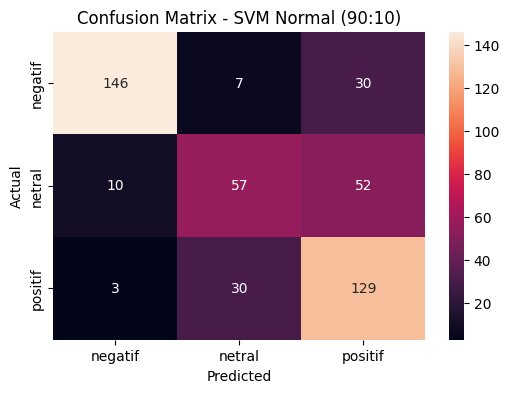


[SVM DENGAN CLASS WEIGHT BALANCED]
              precision    recall  f1-score   support

     negatif       0.94      0.79      0.85       183
      netral       0.53      0.58      0.56       119
     positif       0.63      0.70      0.66       162

    accuracy                           0.70       464
   macro avg       0.70      0.69      0.69       464
weighted avg       0.73      0.70      0.71       464

Accuracy : 0.70
Precision: 0.73
Recall   : 0.70
F1-Score : 0.71


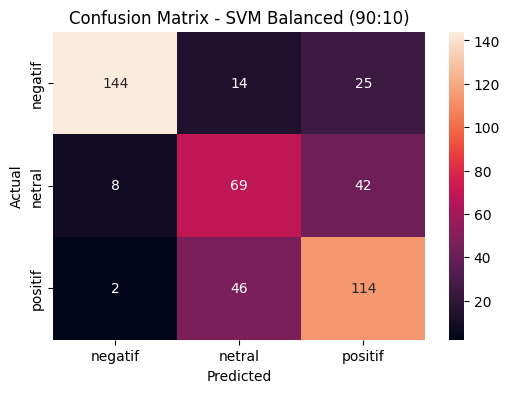


### EVALUASI: 80:20 ###

Ukuran data:
- Jumlah data train: 3711
- Jumlah data test : 928
Distribusi label (train):
label
negatif    1465
positif    1293
netral      953
Name: count, dtype: int64
Distribusi label (test):
label
negatif    366
positif    323
netral     239
Name: count, dtype: int64

[SVM NORMAL]
              precision    recall  f1-score   support

     negatif       0.89      0.80      0.84       366
      netral       0.61      0.47      0.53       239
     positif       0.61      0.78      0.68       323

    accuracy                           0.71       928
   macro avg       0.70      0.68      0.69       928
weighted avg       0.72      0.71      0.71       928

Accuracy : 0.71
Precision: 0.72
Recall   : 0.71
F1-Score : 0.71


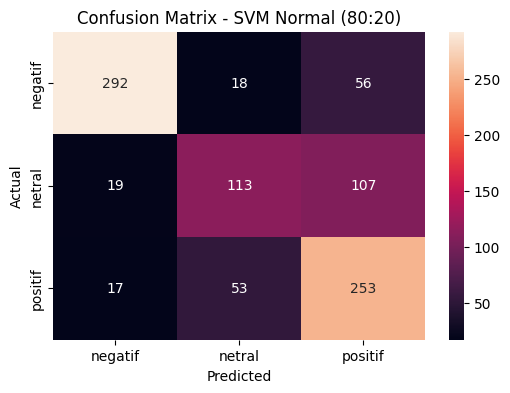


[SVM DENGAN CLASS WEIGHT BALANCED]
              precision    recall  f1-score   support

     negatif       0.90      0.79      0.84       366
      netral       0.56      0.55      0.55       239
     positif       0.62      0.71      0.66       323

    accuracy                           0.70       928
   macro avg       0.69      0.68      0.68       928
weighted avg       0.71      0.70      0.70       928

Accuracy : 0.70
Precision: 0.71
Recall   : 0.70
F1-Score : 0.70


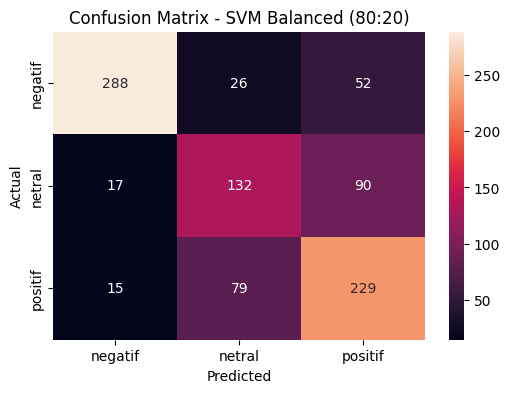


### EVALUASI: 70:30 ###

Ukuran data:
- Jumlah data train: 3247
- Jumlah data test : 1392
Distribusi label (train):
label
negatif    1282
positif    1131
netral      834
Name: count, dtype: int64
Distribusi label (test):
label
negatif    549
positif    485
netral     358
Name: count, dtype: int64

[SVM NORMAL]
              precision    recall  f1-score   support

     negatif       0.86      0.82      0.84       549
      netral       0.63      0.49      0.55       358
     positif       0.63      0.77      0.69       485

    accuracy                           0.72      1392
   macro avg       0.71      0.69      0.69      1392
weighted avg       0.72      0.72      0.71      1392

Accuracy : 0.72
Precision: 0.72
Recall   : 0.72
F1-Score : 0.71


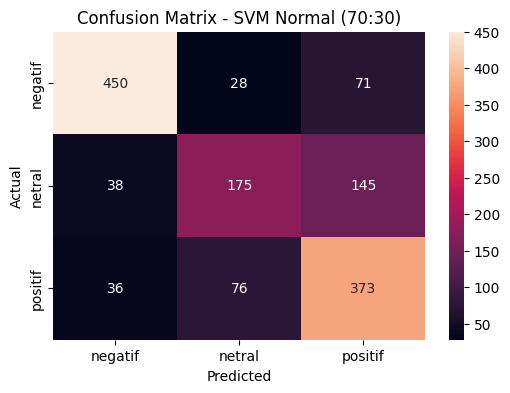


[SVM DENGAN CLASS WEIGHT BALANCED]
              precision    recall  f1-score   support

     negatif       0.87      0.81      0.84       549
      netral       0.57      0.56      0.56       358
     positif       0.64      0.69      0.66       485

    accuracy                           0.70      1392
   macro avg       0.69      0.69      0.69      1392
weighted avg       0.71      0.70      0.71      1392

Accuracy : 0.70
Precision: 0.71
Recall   : 0.70
F1-Score : 0.71


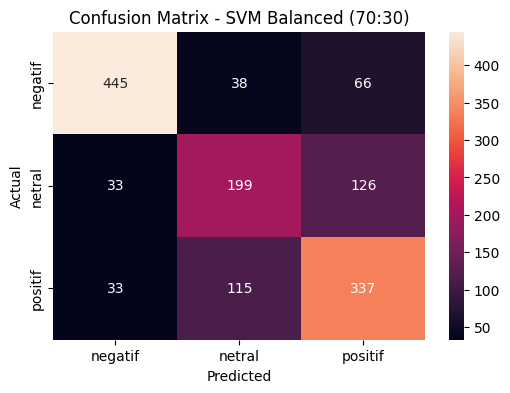


### EVALUASI: 60:40 ###

Ukuran data:
- Jumlah data train: 2783
- Jumlah data test : 1856
Distribusi label (train):
label
negatif    1098
positif     970
netral      715
Name: count, dtype: int64
Distribusi label (test):
label
negatif    733
positif    646
netral     477
Name: count, dtype: int64

[SVM NORMAL]
              precision    recall  f1-score   support

     negatif       0.85      0.83      0.84       733
      netral       0.65      0.46      0.54       477
     positif       0.63      0.79      0.70       646

    accuracy                           0.72      1856
   macro avg       0.71      0.69      0.69      1856
weighted avg       0.72      0.72      0.71      1856

Accuracy : 0.72
Precision: 0.72
Recall   : 0.72
F1-Score : 0.71


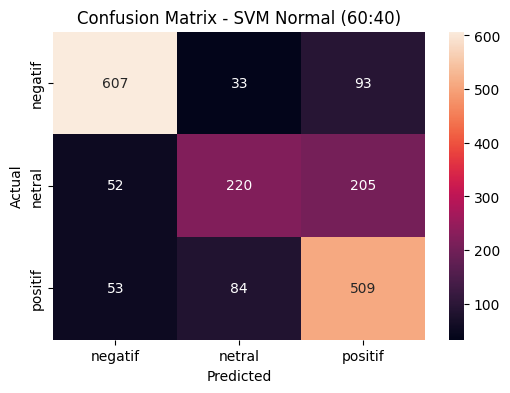


[SVM DENGAN CLASS WEIGHT BALANCED]
              precision    recall  f1-score   support

     negatif       0.87      0.82      0.84       733
      netral       0.56      0.56      0.56       477
     positif       0.64      0.68      0.66       646

    accuracy                           0.71      1856
   macro avg       0.69      0.69      0.69      1856
weighted avg       0.71      0.71      0.71      1856

Accuracy : 0.71
Precision: 0.71
Recall   : 0.71
F1-Score : 0.71


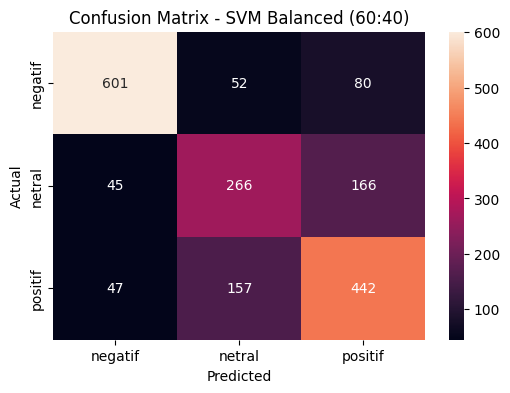

In [ ]:
# EVALUASI (SVM NORMAL vs SVM BALANCED)

import pickle
from sklearn.metrics import classification_report, accuracy_score, precision_score, recall_score, f1_score, confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt

with open("hasil_data_mining.pkl", "rb") as f:
    hasil_data_mining = pickle.load(f)

labels = ['negatif', 'netral', 'positif']

for scenario_name, hasil in hasil_data_mining.items():
    print(f"\n### EVALUASI: {scenario_name} ###")

    y_test = hasil["y_test"]

    # =======================
    # INFO DATA
    # =======================
    print(f"\nUkuran data:")
    print(f"- Jumlah data train: {hasil['train_size']}")
    print(f"- Jumlah data test : {hasil['test_size']}")

    print("Distribusi label (train):")
    print(hasil["train_dist"])

    print("Distribusi label (test):")
    print(hasil["test_dist"])

    # =======================
    # SVM NORMAL
    # =======================
    print("\n[SVM NORMAL]")
    y_pred = hasil["y_pred"]

    print(classification_report(y_test, y_pred, zero_division=0))
    print(f"Accuracy : {accuracy_score(y_test, y_pred):.2f}")
    print(f"Precision: {precision_score(y_test, y_pred, average='weighted', zero_division=0):.2f}")
    print(f"Recall   : {recall_score(y_test, y_pred, average='weighted', zero_division=0):.2f}")
    print(f"F1-Score : {f1_score(y_test, y_pred, average='weighted', zero_division=0):.2f}")

    cm = confusion_matrix(y_test, y_pred, labels=labels)
    plt.figure(figsize=(6,4))
    sns.heatmap(cm, annot=True, fmt="d",
                xticklabels=labels, yticklabels=labels)
    plt.title(f"Confusion Matrix - SVM Normal ({scenario_name})")
    plt.xlabel("Predicted")
    plt.ylabel("Actual")
    plt.show()

    # =======================
    # SVM BALANCED
    # =======================
    print("\n[SVM DENGAN CLASS WEIGHT BALANCED]")
    y_pred_balanced = hasil["y_pred_balanced"]

    print(classification_report(y_test, y_pred_balanced, zero_division=0))
    print(f"Accuracy : {accuracy_score(y_test, y_pred_balanced):.2f}")
    print(f"Precision: {precision_score(y_test, y_pred_balanced, average='weighted', zero_division=0):.2f}")
    print(f"Recall   : {recall_score(y_test, y_pred_balanced, average='weighted', zero_division=0):.2f}")
    print(f"F1-Score : {f1_score(y_test, y_pred_balanced, average='weighted', zero_division=0):.2f}")

    cm = confusion_matrix(y_test, y_pred_balanced, labels=labels)
    plt.figure(figsize=(6,4))
    sns.heatmap(cm, annot=True, fmt="d",
                xticklabels=labels, yticklabels=labels)
    plt.title(f"Confusion Matrix - SVM Balanced ({scenario_name})")
    plt.xlabel("Predicted")
    plt.ylabel("Actual")
    plt.show()

# **KNOWLEDGE PRESENTATION**

# **SENTIMENT POSITIF**

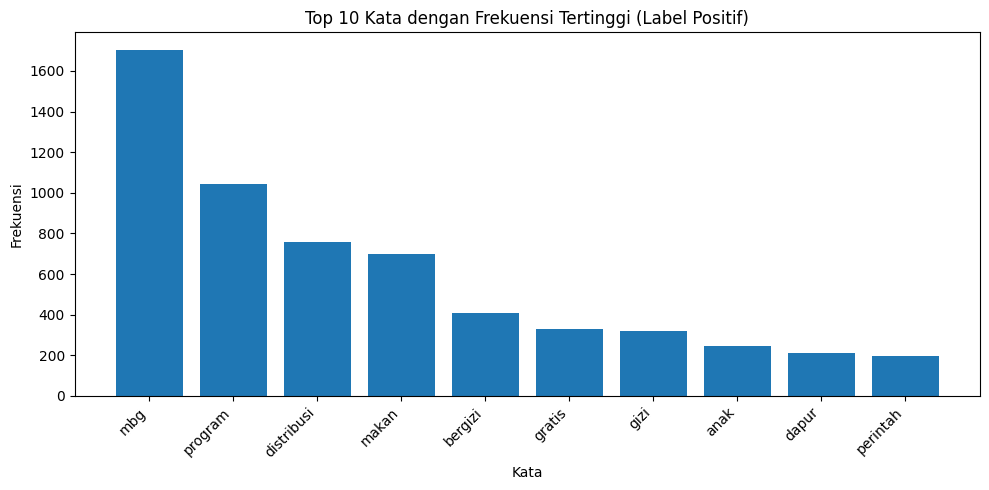

In [ ]:
import matplotlib.pyplot as plt
import pandas as pd
from collections import Counter
import re

# Filter data untuk label positif
positive_data = data[data['label'] == 'positif']

# Gabungkan semua kata dalam kolom 'stemming' untuk label positif
all_positive_words = ' '.join(positive_data['stemming'].astype(str).tolist())

# Preprocessing tambahan untuk membersihkan teks
def clean_text(text):
    # Hapus karakter non-alfanumerik kecuali spasi
    text = re.sub(r"[^a-zA-Z0-9 ]", '', text)
    # Hapus spasi berlebih
    text = re.sub(' +', ' ', text)
    return text

all_positive_words = clean_text(all_positive_words)

# Hitung frekuensi kata
word_counts = Counter(all_positive_words.split())

# Ambil 10 kata dengan frekuensi tertinggi
top_10_words = word_counts.most_common(10)

# Buat DataFrame untuk grafik batang
df_top10 = pd.DataFrame(top_10_words, columns=['Kata', 'Frekuensi'])

# Buat grafik batang
plt.figure(figsize=(10, 5))
plt.bar(df_top10['Kata'], df_top10['Frekuensi'])
plt.title('Top 10 Kata dengan Frekuensi Tertinggi (Label Positif)')
plt.xlabel('Kata')
plt.ylabel('Frekuensi')
plt.xticks(rotation=45, ha='right')  # Rotasi label sumbu x agar mudah dibaca
plt.tight_layout()
plt.show()

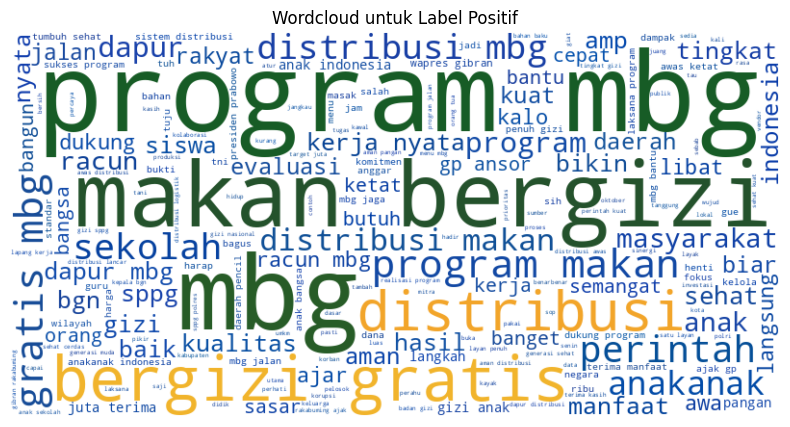

In [ ]:
from wordcloud import WordCloud, STOPWORDS
import matplotlib.pyplot as plt
import re
import random

# Filter data untuk label positif
positive_data = data[data['label'] == 'positif']
all_positive_words = ' '.join(positive_data['stemming'].astype(str).tolist())

def clean_text(text):
    text = re.sub(r"[^a-zA-Z0-9 \-]", '', text)
    text = re.sub(' +', ' ', text)
    return text

all_positive_words = clean_text(all_positive_words)

# ================== COLOR FUNCTION SENTIMEN POSITIF ==================
def size_based_color_func(word, font_size, position, orientation,
                          random_state=None, **kwargs):

    if font_size >= 90:
        # Hijau Tua #1B5E20 (besar)
        base = (27, 94, 32)

    elif 50 <= font_size < 90:
        # Kuning Tua/Emas #F9A825 (sedang)
        base = (249, 168, 37)

    else:
        # Biru Tua #0D47A1 (kecil)
        base = (13, 71, 161)

    # Variasi kecil agar tidak monoton
    r = min(255, max(0, base[0] + random.randint(-12, 12)))
    g = min(255, max(0, base[1] + random.randint(-12, 12)))
    b = min(255, max(0, base[2] + random.randint(-12, 12)))

    return f"rgb({r}, {g}, {b})"
# ====================================================================

wordcloud = WordCloud(
    width=800,
    height=400,
    background_color='white',
    stopwords=STOPWORDS,
    regexp=r"\w[\w'-]+",
    color_func=size_based_color_func
).generate(all_positive_words)

plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.title('Wordcloud untuk Label Positif')
plt.show()

# **SENTIMENT NEGATIF**

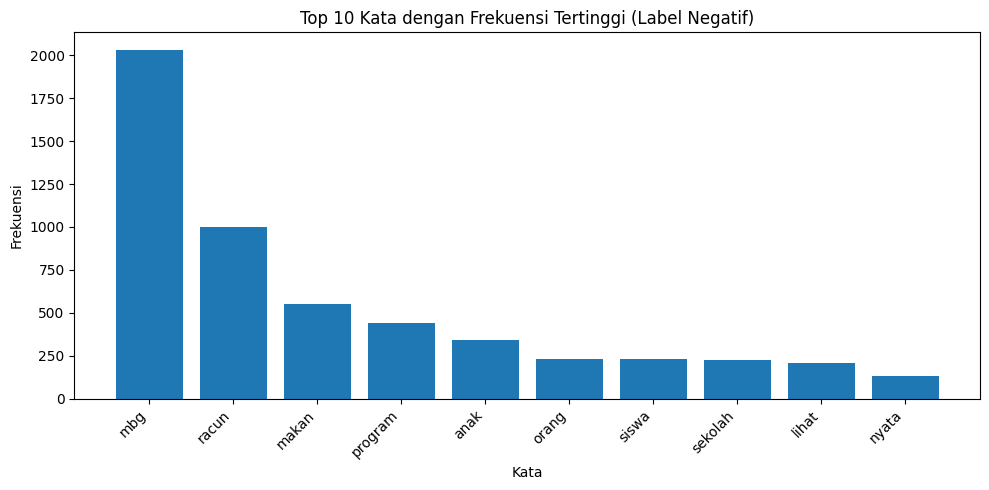

In [ ]:
import matplotlib.pyplot as plt
import pandas as pd
from collections import Counter
import re

# Filter data untuk label negatif
negative_data = data[data['label'] == 'negatif']

# Gabungkan semua kata dalam kolom 'stemming' untuk label negatif
all_negative_words = ' '.join(negative_data['stemming'].astype(str).tolist())

# Preprocessing tambahan untuk membersihkan teks
def clean_text(text):
    # Hapus karakter non-alfanumerik kecuali spasi
    text = re.sub(r"[^a-zA-Z0-9 ]", '', text)
    # Hapus spasi berlebih
    text = re.sub(' +', ' ', text)
    return text

all_negative_words = clean_text(all_negative_words)

# Hitung frekuensi kata
word_counts = Counter(all_negative_words.split())

# Ambil 10 kata dengan frekuensi tertinggi
top_10_words = word_counts.most_common(10)

# Buat DataFrame untuk grafik batang
df_top10 = pd.DataFrame(top_10_words, columns=['Kata', 'Frekuensi'])

# Buat grafik batang
plt.figure(figsize=(10, 5))
plt.bar(df_top10['Kata'], df_top10['Frekuensi'])
plt.title('Top 10 Kata dengan Frekuensi Tertinggi (Label Negatif)')
plt.xlabel('Kata')
plt.ylabel('Frekuensi')
plt.xticks(rotation=45, ha='right')  # Rotasi label sumbu x agar mudah dibaca
plt.tight_layout()
plt.show()

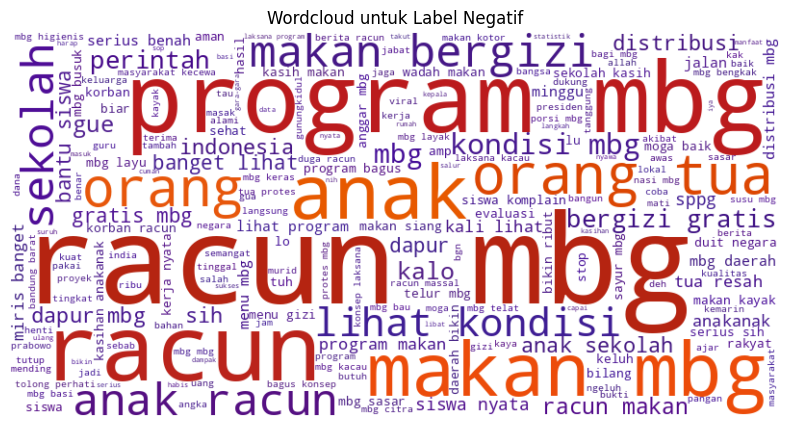

In [ ]:
from wordcloud import WordCloud, STOPWORDS
import matplotlib.pyplot as plt
import re
import random

# Filter data untuk label negatif
negative_data = data[data['label'] == 'negatif']
all_negative_words = ' '.join(negative_data['stemming'].astype(str).tolist())

def clean_text(text):
    text = re.sub(r"[^a-zA-Z0-9 \-]", '', text)
    text = re.sub(' +', ' ', text)
    return text

all_negative_words = clean_text(all_negative_words)

# ================== COLOR FUNCTION SENTIMEN NEGATIF ==================
def negative_size_color_func(word, font_size, position, orientation,
                             random_state=None, **kwargs):

    if font_size >= 90:
        # Merah Tua #B71C1C (besar)
        base = (183, 28, 28)

    elif 50 <= font_size < 90:
        # Oranye Tua #E65100 (sedang)
        base = (230, 81, 0)

    else:
        # Ungu Tua #4A148C (kecil)
        base = (74, 20, 140)

    # Variasi kecil agar tidak monoton
    r = min(255, max(0, base[0] + random.randint(-12, 12)))
    g = min(255, max(0, base[1] + random.randint(-12, 12)))
    b = min(255, max(0, base[2] + random.randint(-12, 12)))

    return f"rgb({r}, {g}, {b})"
# =====================================================================

wordcloud = WordCloud(
    width=800,
    height=400,
    background_color='white',
    stopwords=STOPWORDS,
    regexp=r"\w[\w'-]+",
    color_func=negative_size_color_func
).generate(all_negative_words)

plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.title('Wordcloud untuk Label Negatif')
plt.show()

# **SENTIMENT NETRAL**

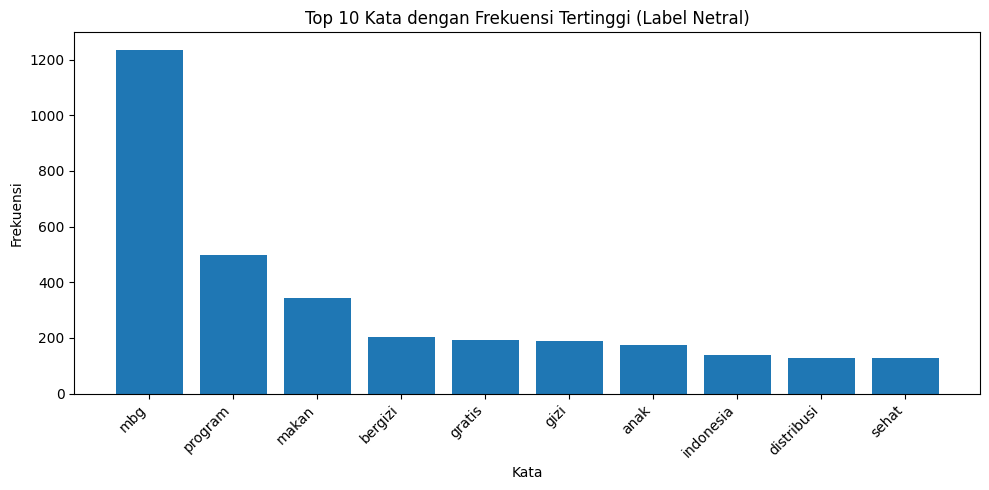

In [ ]:
import matplotlib.pyplot as plt
import pandas as pd
from collections import Counter
import re

# Filter data untuk label netral
neutral_data = data[data['label'] == 'netral']

# Gabungkan semua kata dalam kolom 'stemming' untuk label netral
all_neutral_words = ' '.join(neutral_data['stemming'].astype(str).tolist())

# Preprocessing tambahan untuk membersihkan teks
def clean_text(text):
    # Hapus karakter non-alfanumerik kecuali spasi
    text = re.sub(r"[^a-zA-Z0-9 ]", '', text)
    # Hapus spasi berlebih
    text = re.sub(' +', ' ', text)
    return text

all_neutral_words = clean_text(all_neutral_words)

# Hitung frekuensi kata
word_counts = Counter(all_neutral_words.split())

# Ambil 10 kata dengan frekuensi tertinggi
top_10_words = word_counts.most_common(10)

# Buat DataFrame untuk grafik batang
df_top10 = pd.DataFrame(top_10_words, columns=['Kata', 'Frekuensi'])

# Buat grafik batang
plt.figure(figsize=(10, 5))
plt.bar(df_top10['Kata'], df_top10['Frekuensi'])
plt.title('Top 10 Kata dengan Frekuensi Tertinggi (Label Netral)')
plt.xlabel('Kata')
plt.ylabel('Frekuensi')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

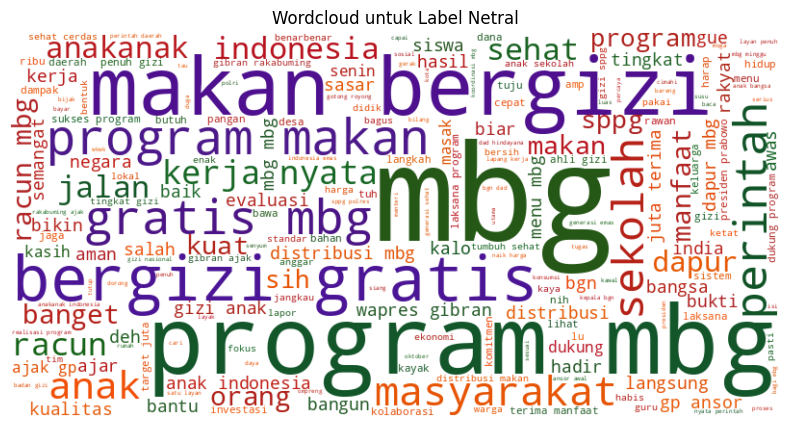

In [ ]:
from wordcloud import WordCloud, STOPWORDS
import matplotlib.pyplot as plt
import re
import random

# Filter data untuk label netral
neutral_data = data[data['label'] == 'netral']
all_neutral_words = ' '.join(neutral_data['stemming'].astype(str).tolist())

def clean_text(text):
    text = re.sub(r"[^a-zA-Z0-9 \-]", '', text)
    text = re.sub(' +', ' ', text)
    return text

all_neutral_words = clean_text(all_neutral_words)

# ================== COLOR FUNCTION SENTIMEN NETRAL ==================
def neutral_color_func(word, font_size, position, orientation,
                       random_state=None, **kwargs):

    if font_size >= 90:
        # Hijau Tua #1B5E20 (besar)
        base = (27, 94, 32)

    elif 50 <= font_size < 90:
        # Ungu Tua #4A148C (sedang)
        base = (74, 20, 140)

    else:
        # Kecil: pilih acak 3 warna
        small_colors = [
            (230, 81, 0),   # Oranye Tua #E65100
            (183, 28, 28),  # Merah Tua #B71C1C
            (27, 94, 32)    # Hijau Tua #1B5E20
        ]
        base = random.choice(small_colors)

    r = min(255, max(0, base[0] + random.randint(-10, 10)))
    g = min(255, max(0, base[1] + random.randint(-10, 10)))
    b = min(255, max(0, base[2] + random.randint(-10, 10)))

    return f"rgb({r}, {g}, {b})"
# ===========================================================

wordcloud = WordCloud(
    width=800,
    height=400,
    background_color='white',
    stopwords=STOPWORDS,
    regexp=r"\w[\w'-]+",
    color_func=neutral_color_func
).generate(all_neutral_words)

plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.title('Wordcloud untuk Label Netral')
plt.show()



---


# **DONE**


---

